# تحلیل توییت های سازمان ملل متحد درباره حسن روحانی

In [1]:
import networkx as nx
from pylab import rcParams
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.colors as mcolors

In [2]:
%matplotlib inline
rcParams['figure.figsize']=5,4
sns.set_style('whitegrid')

In [3]:
df=pd.read_excel('TweetsUNARouhani.xlsx')
df

,Date,Screen Name,Full Name,Tweet Text,Tweet ID,Link(s),Media,Location,App,Followers,Follows,Listed,Verfied,User Since,Location.1,Bio,Website,Timezone,Profile Image
0,2018-09-26 18:18:20,@Shabnam727,Shabnam,RT @YaarDabestaani: وضعیت یه جوریه که اگه #ترا...,1044961877984309248,NaN,NaN,NaN,Twitter for iPhone,194,207,0,NaN,2017-01-25 00:25:45,NaN,"Mom, wife, Conservative, Chem Eng, focused on ...",NaN,NaN,View
1,2018-09-26 18:18:11,@irani_azad_abad,aria,RT @PesarNoah: اخبار صداسیما پشت سر هم تکرار م...,1044961839908614145,NaN,https://pbs.twimg.com/media/DoBBVW7U0AADI7R.jpg,NaN,Twitter for Android,2348,1959,2,NaN,2017-08-24 11:11:44,NaN,‏‏‏‏من با خودم بد جور به هم زدم؛ سیاسی نیستم و...,NaN,NaN,View
2,2018-09-26 18:18:08,@IranTehran313,13,اغای #روحانی خسته نباشی!نمیشد شما هم بری تو #س...,1044961826507710464,NaN,NaN,NaN,Twitter for iPhone,4,0,0,NaN,2014-04-28 02:53:03,NaN,NaN,NaN,NaN,View
3,2018-09-26 18:17:43,@Saman_gh6,straße,RT @YaarDabestaani: وضعیت یه جوریه که اگه #ترا...,1044961723122405376,NaN,NaN,NaN,Twitter for Android,64,78,1,NaN,2018-01-04 15:37:20,NaN,‏‏‏‌ما بر آن شده‌ایم تا سر بر میله‌ها بکوبیم. ...,NaN,NaN,View
4,2018-09-26 18:17:40,@mohaam110,مُحـٰــ امـٖـ 🇮🇷,RT @Alirezahse: کاش روحانی از سازمان ملل به کش...,1044961707599298562,NaN,NaN,NaN,Twitter for Android,894,900,0,NaN,2017-12-22 03:04:13,جمهوری اسلامی ایران,‏‏‏‏‏‏‏‏‏‏‏‏السلام علیک یا اباعبدلله الحسین.. ...,NaN,NaN,View
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,2018-09-26 01:03:59,@namiraa63,نــامیــــــــرا🏴,RT @mahdi_nostatii: امروز سخنرانی رئیس جمهور د...,1044701573572702213,NaN,NaN,NaN,Twitter for Android,1128,1006,1,NaN,2018-07-19 15:10:46,NaN,‏‏‏‏‏‏‏‏‏اکانت اصلی (‎‎‎‎‎‎‎‎‎@namira63),NaN,NaN,View
1494,2018-09-26 01:03:56,@Tabassom_Ak,Tabassom,RT @Taha_mahmoudi: . روحانی در سازمان ملل باصل...,1044701561274986506,NaN,https://pbs.twimg.com/media/Dn-C75wXgAUpPC2.jpg,NaN,Twitter for iPhone,18,27,0,NaN,2018-07-23 00:36:05,Islamic Republic of Iran,literature student at Guilan university,NaN,NaN,View
1495,2018-09-26 01:03:37,@ashvazdanghe,Shahram,RT @sp_hos: ان‌شاءالله کلیدواژه سخنرانی امشب #...,1044701479854993408,NaN,NaN,NaN,Twitter for Android,570,1143,1,NaN,2013-09-30 23:08:32,"Tehran,iran",NaN,https://www.shiachat.com/,NaN,View
1496,2018-09-26 01:03:32,@amir_markabii,AmirMarkabi,سخنان امشب #روحانی در #سازمان_ملل همانند مناظر...,1044701461668614144,NaN,NaN,NaN,Twitter for Android,51,137,0,NaN,2017-12-27 00:31:37,Astara,فارغ از هر زنده باد و مرده باد/سر به اصلاح وطن...,NaN,NaN,View


In [4]:
df.isnull().sum()

Date                0
Screen Name         0
Full Name           2
Tweet Text          0
Tweet ID            0
Link(s)          1434
Media             992
Location         1498
App                 0
Followers           0
Follows             0
Listed              0
Verfied          1493
User Since          0
Location.1        664
Bio               370
Website          1315
Timezone         1498
Profile Image       0
dtype: int64

In [5]:
df=df[['Tweet ID','Followers']]
df

,Tweet ID,Followers
0,1044961877984309248,194
1,1044961839908614145,2348
2,1044961826507710464,4
3,1044961723122405376,64
4,1044961707599298562,894
...,...,...
1493,1044701573572702213,1128
1494,1044701561274986506,18
1495,1044701479854993408,570
1496,1044701461668614144,51


In [6]:
# Read Our Edgelist
fs_graph = nx.from_pandas_edgelist(df,source="Tweet ID",target="Followers")

In [7]:
type(fs_graph)

networkx.classes.graph.Graph

In [8]:
# Info
print(fs_graph)

Graph with 2282 nodes and 1498 edges


In [9]:
# Check All Nodes/Object/People
fs_graph.nodes()

NodeView((1044961877984309248, 194, 1044961839908614145, 2348, 1044961826507710464, 4, 1044961723122405376, 64, 1044961707599298562, 894, 1044961690960433152, 52, 1044961552959451137, 173, 1044961495816261632, 35, 1044961487582896129, 435, 1044961411854733313, 559, 1044961294372212736, 83, 1044961260855529472, 120, 1044961172632621056, 1022, 1044961132824457216, 183, 1044960916096389120, 796, 1044960763968917504, 38, 1044960738127884288, 75, 1044960704808325120, 161, 1044960662445682688, 14541, 1044960418911932421, 114, 1044960366374129664, 110, 1044960337492103168, 91, 1044960328285597696, 567, 1044960266285469697, 1975, 1044960137256079361, 51, 1044960101042475008, 47, 1044960053336387584, 160, 1044959878224261121, 1044959863871336449, 41, 1044959762956394496, 220, 1044959535549607937, 487, 1044959458395394048, 368, 1044959278178676736, 106, 1044959143864545281, 2010, 1044959125988429824, 37, 1044959118199582721, 347, 1044959013828526081, 76, 1044958995864334337, 59, 1044958967909224

In [10]:
len(fs_graph.nodes())

2282

In [11]:
len(fs_graph.edges())

1498

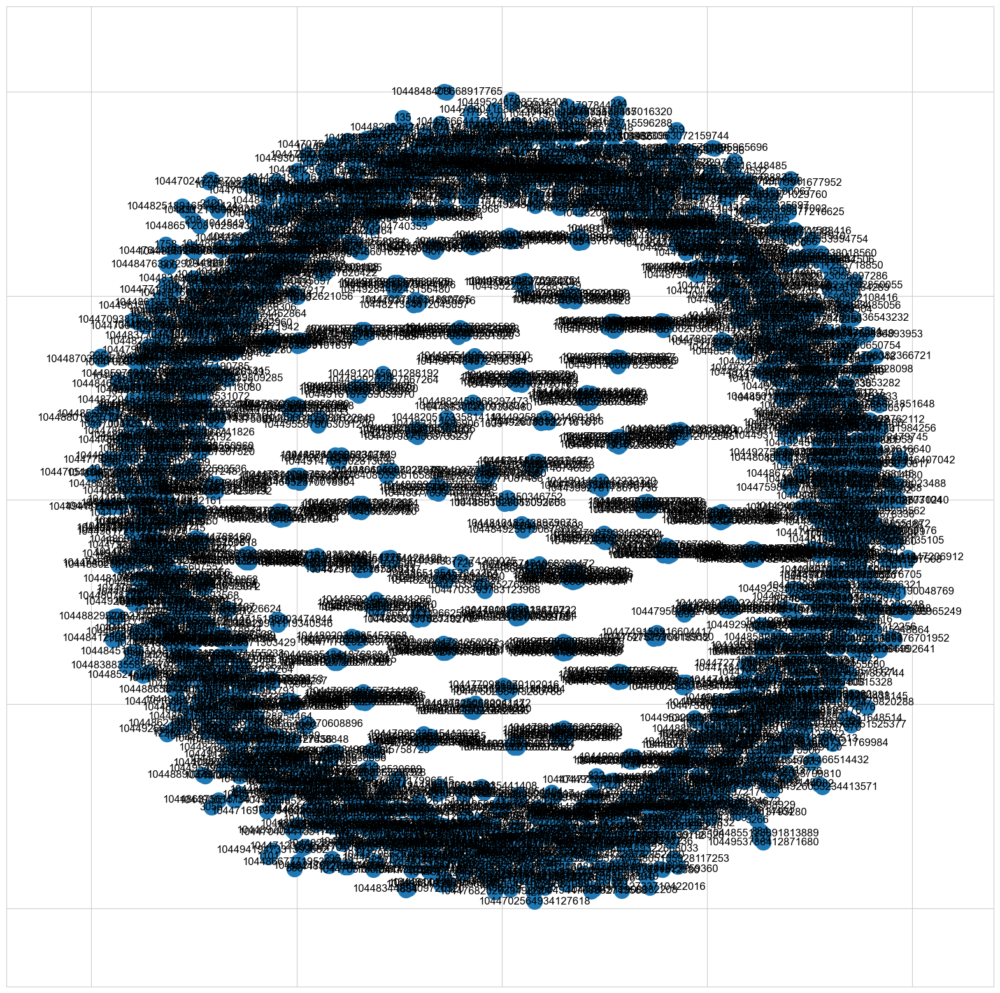

In [12]:
plt.figure(figsize=(20,20))
nx.draw_networkx(fs_graph)
plt.show()

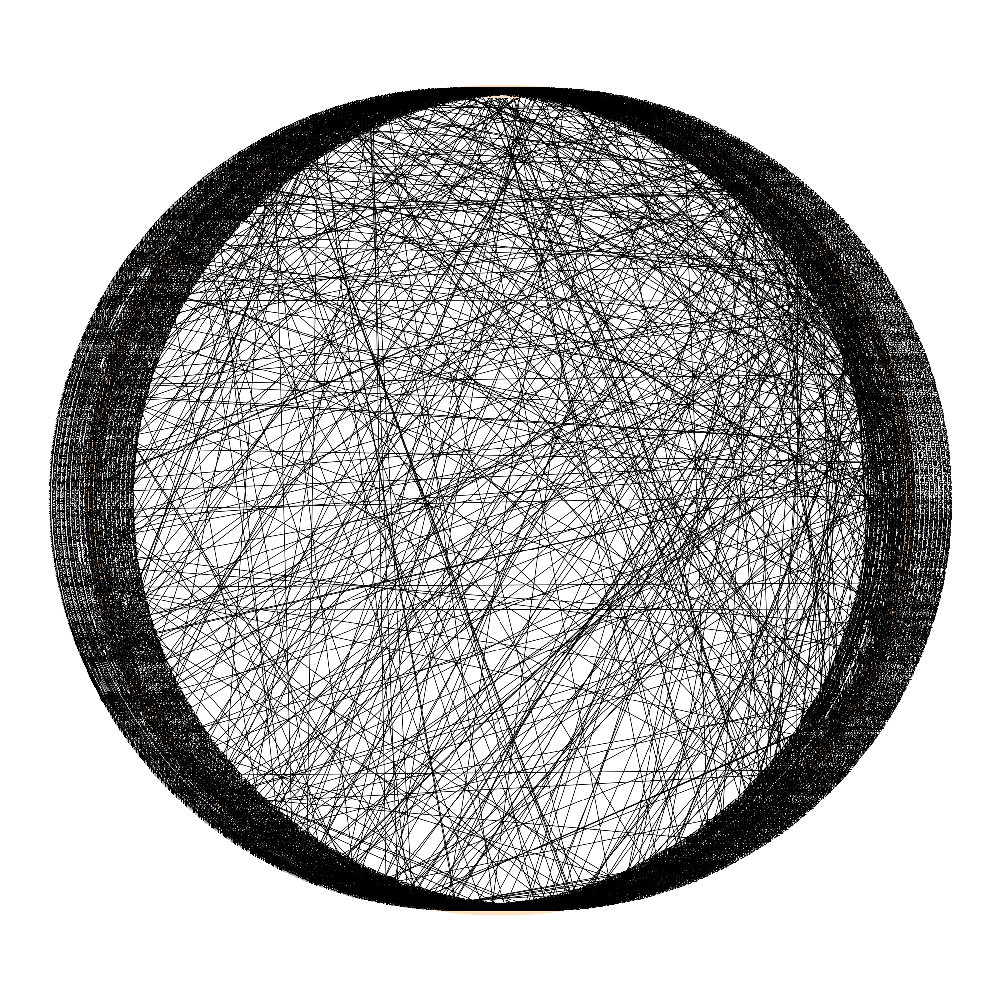

In [13]:
plt.figure(figsize=(20,20))
nx.draw_circular(fs_graph, node_color='bisque', with_labels=True)

In [14]:
G=fs_graph.to_undirected()

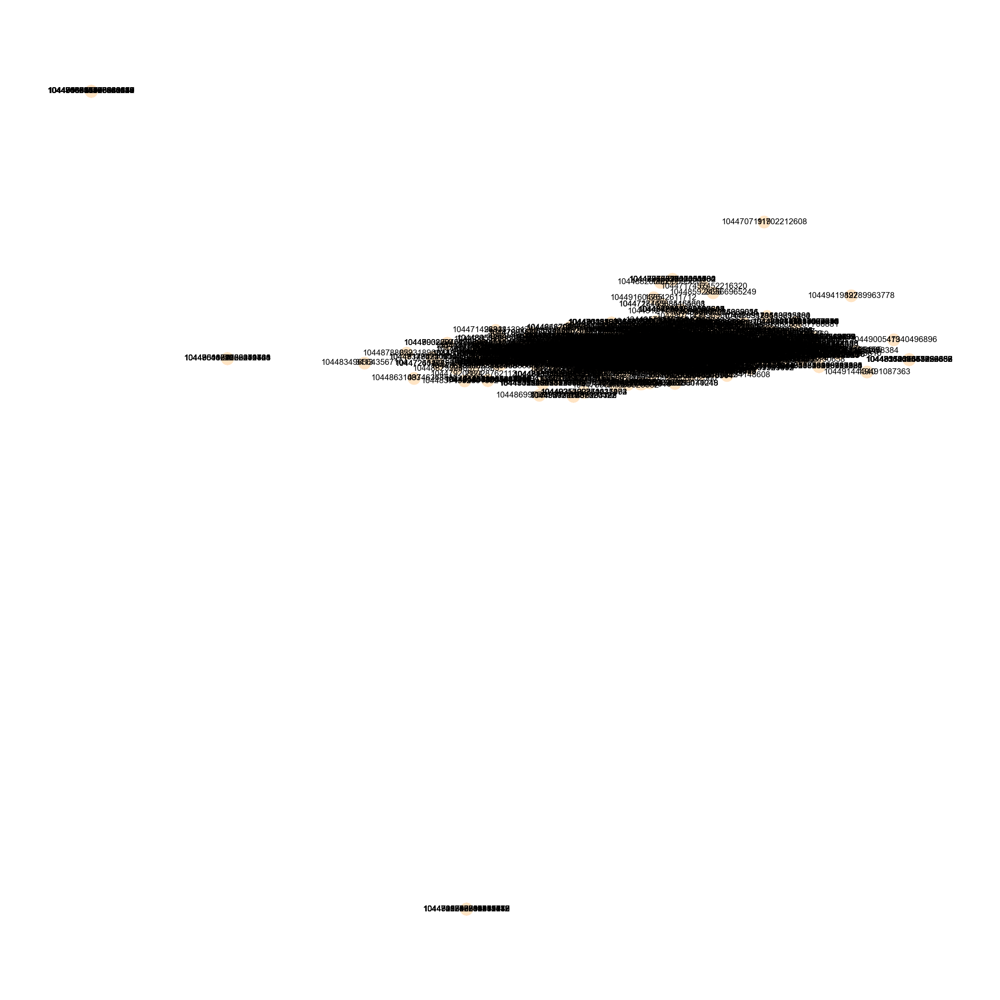

In [15]:
plt.figure(figsize=(20,20))
nx.draw_spectral(G, node_color='bisque', with_labels=True)

In [16]:
print('Number of nodes', len(fs_graph.nodes))
print('Number of edges', len(fs_graph.edges))
print('Average degree', sum(dict(fs_graph.degree).values()) / len(fs_graph.nodes))

Number of nodes 2282
Number of edges 1498
Average degree 1.312883435582822


In [17]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)
    
    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [18]:
deg= dict(fs_graph.degree())
nx.set_node_attributes(fs_graph,deg,'degree')

bc=nx.betweenness_centrality(fs_graph)
nx.set_node_attributes(fs_graph,bc,'BC')

t= pd.DataFrame.from_dict(dict(fs_graph.nodes(data=True)),orient='index')
t[0:5]

,degree,BC
1044961877984309248,1,0.000000e+00
194,2,3.845651e-07
1044961839908614145,1,0.000000e+00
2348,1,0.000000e+00
1044961826507710464,1,0.000000e+00


In [19]:
pos = nx.spring_layout(fs_graph, seed=675)

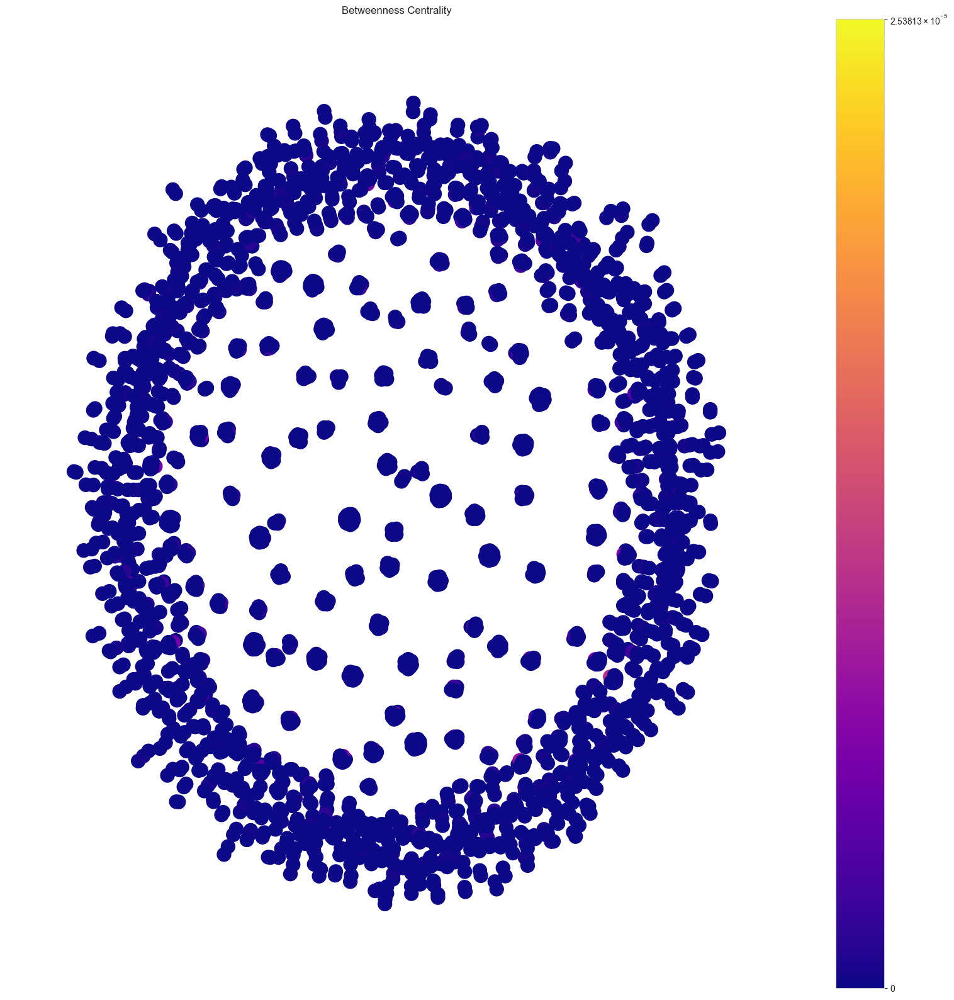

In [20]:
plt.figure(figsize=(20,20))
draw(G, pos, nx.betweenness_centrality(fs_graph), 'Betweenness Centrality')

In [21]:
t.sort_values('BC',ascending=False)[0:4]

,degree,BC
0,12,0.000025
13,12,0.000025
132,11,0.000021
75,11,0.000021


In [22]:
max(deg.keys() , key=lambda  x:deg[x])

13

In [23]:
deg= dict(fs_graph.degree())
nx.set_node_attributes(fs_graph,deg,'degree')

dc=nx.degree_centrality(fs_graph)
nx.set_node_attributes(fs_graph,dc,'DC')

t= pd.DataFrame.from_dict(dict(fs_graph.nodes(data=True)),orient='index')
t[0:5]

,degree,BC,DC
1044961877984309248,1,0.000000e+00,0.000438
194,2,3.845651e-07,0.000877
1044961839908614145,1,0.000000e+00,0.000438
2348,1,0.000000e+00,0.000438
1044961826507710464,1,0.000000e+00,0.000438


In [24]:
t.sort_values('DC',ascending=False)[0:4]

,degree,BC,DC
0,12,0.000025,0.005261
13,12,0.000025,0.005261
132,11,0.000021,0.004822
75,11,0.000021,0.004822


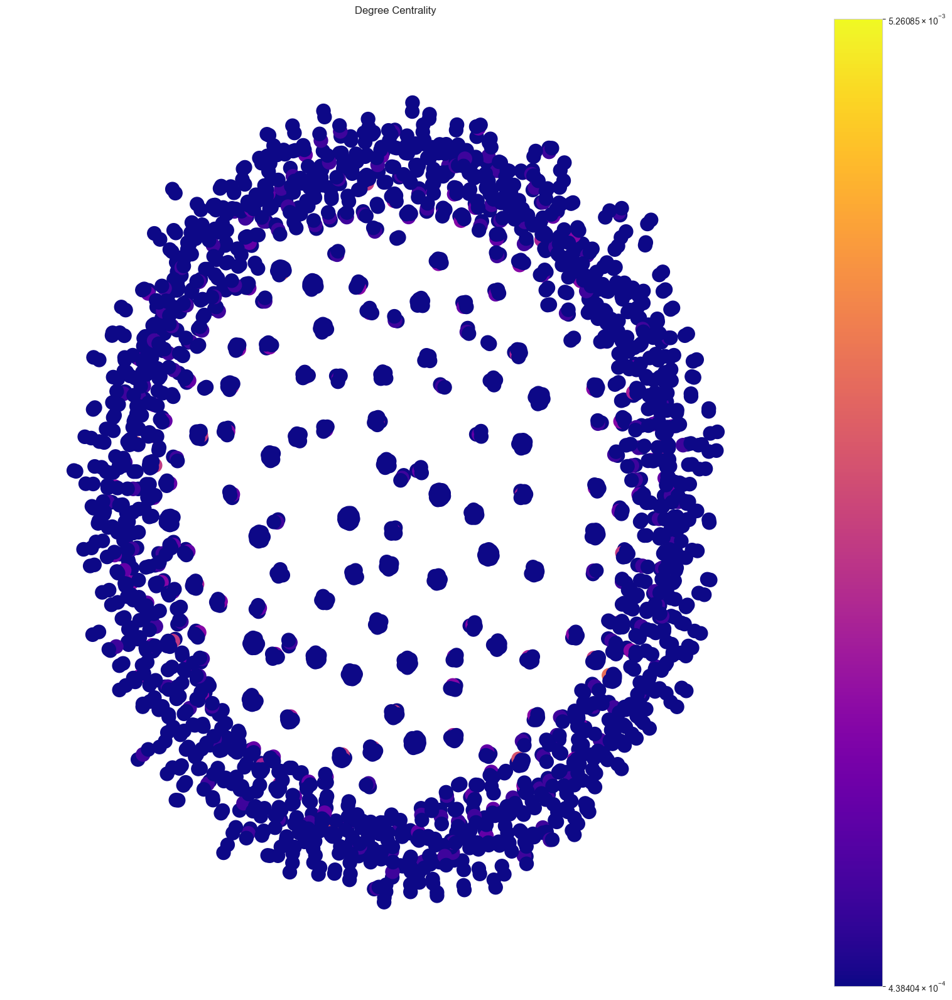

In [25]:
plt.figure(figsize=(20,20))
draw(G, pos, nx.degree_centrality(fs_graph), 'Degree Centrality')

In [26]:
cc=nx.clustering(nx.Graph(fs_graph))
cc

{1044961877984309248: 0,
 194: 0,
 1044961839908614145: 0,
 2348: 0,
 1044961826507710464: 0,
 4: 0,
 1044961723122405376: 0,
 64: 0,
 1044961707599298562: 0,
 894: 0,
 1044961690960433152: 0,
 52: 0,
 1044961552959451137: 0,
 173: 0,
 1044961495816261632: 0,
 35: 0,
 1044961487582896129: 0,
 435: 0,
 1044961411854733313: 0,
 559: 0,
 1044961294372212736: 0,
 83: 0,
 1044961260855529472: 0,
 120: 0,
 1044961172632621056: 0,
 1022: 0,
 1044961132824457216: 0,
 183: 0,
 1044960916096389120: 0,
 796: 0,
 1044960763968917504: 0,
 38: 0,
 1044960738127884288: 0,
 75: 0,
 1044960704808325120: 0,
 161: 0,
 1044960662445682688: 0,
 14541: 0,
 1044960418911932421: 0,
 114: 0,
 1044960366374129664: 0,
 110: 0,
 1044960337492103168: 0,
 91: 0,
 1044960328285597696: 0,
 567: 0,
 1044960266285469697: 0,
 1975: 0,
 1044960137256079361: 0,
 51: 0,
 1044960101042475008: 0,
 47: 0,
 1044960053336387584: 0,
 160: 0,
 1044959878224261121: 0,
 1044959863871336449: 0,
 41: 0,
 1044959762956394496: 0,
 220:

In [27]:
acc = nx.average_clustering(nx.Graph(fs_graph))
print(acc)

0.0


In [28]:
trans = nx.transitivity(fs_graph)
print(trans)

0


In [29]:
deg= dict(fs_graph.degree())
nx.set_node_attributes(fs_graph,deg,'degree')

hc=nx.harmonic_centrality(fs_graph)
nx.set_node_attributes(fs_graph,hc,'HC')

t= pd.DataFrame.from_dict(dict(fs_graph.nodes(data=True)),orient='index')
t[0:5]

,degree,BC,DC,HC
1044961877984309248,1,0.000000e+00,0.000438,1.5
194,2,3.845651e-07,0.000877,2.0
1044961839908614145,1,0.000000e+00,0.000438,1.0
2348,1,0.000000e+00,0.000438,1.0
1044961826507710464,1,0.000000e+00,0.000438,4.5


In [30]:
t.sort_values('HC',ascending=False)[0:4]

,degree,BC,DC,HC
13,12,0.000025,0.005261,12.0
0,12,0.000025,0.005261,12.0
14,11,0.000021,0.004822,11.0
132,11,0.000021,0.004822,11.0


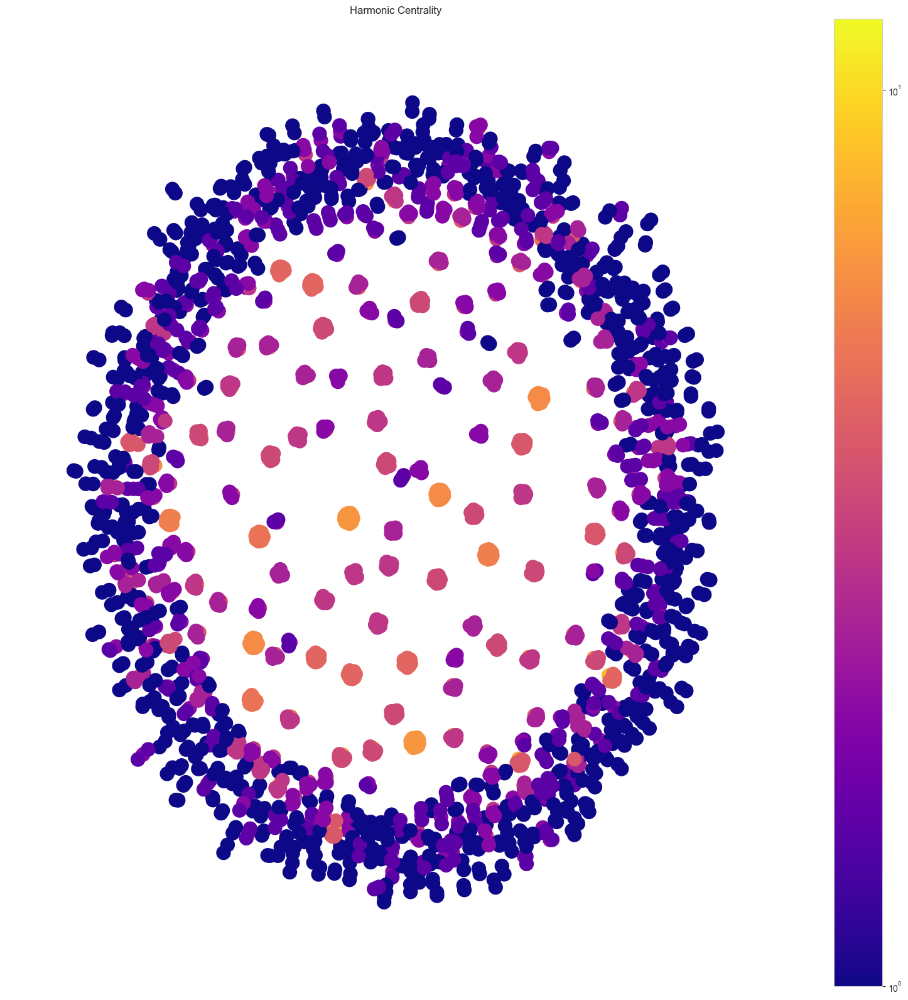

In [31]:
plt.figure(figsize=(20,20))
draw(fs_graph, pos, nx.harmonic_centrality(fs_graph), 'Harmonic Centrality')

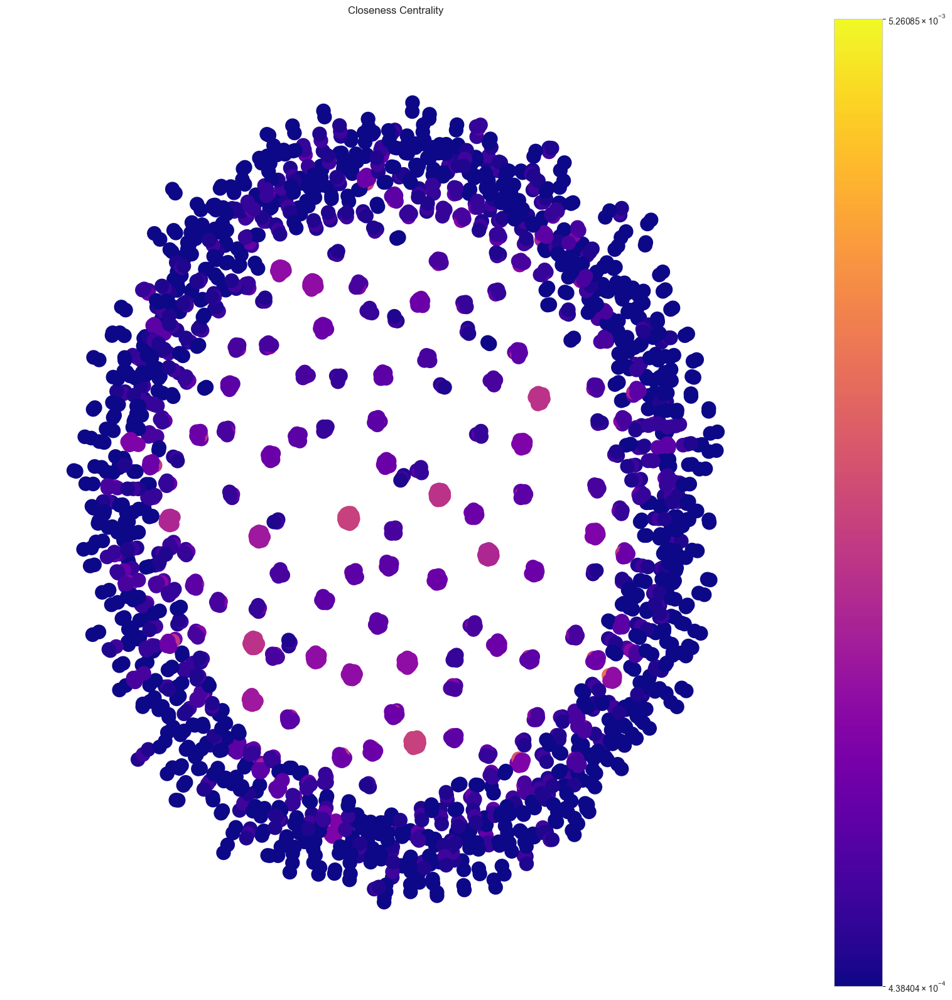

In [32]:
plt.figure(figsize=(20,20))
draw(G, pos, nx.closeness_centrality(fs_graph), 'Closeness Centrality')

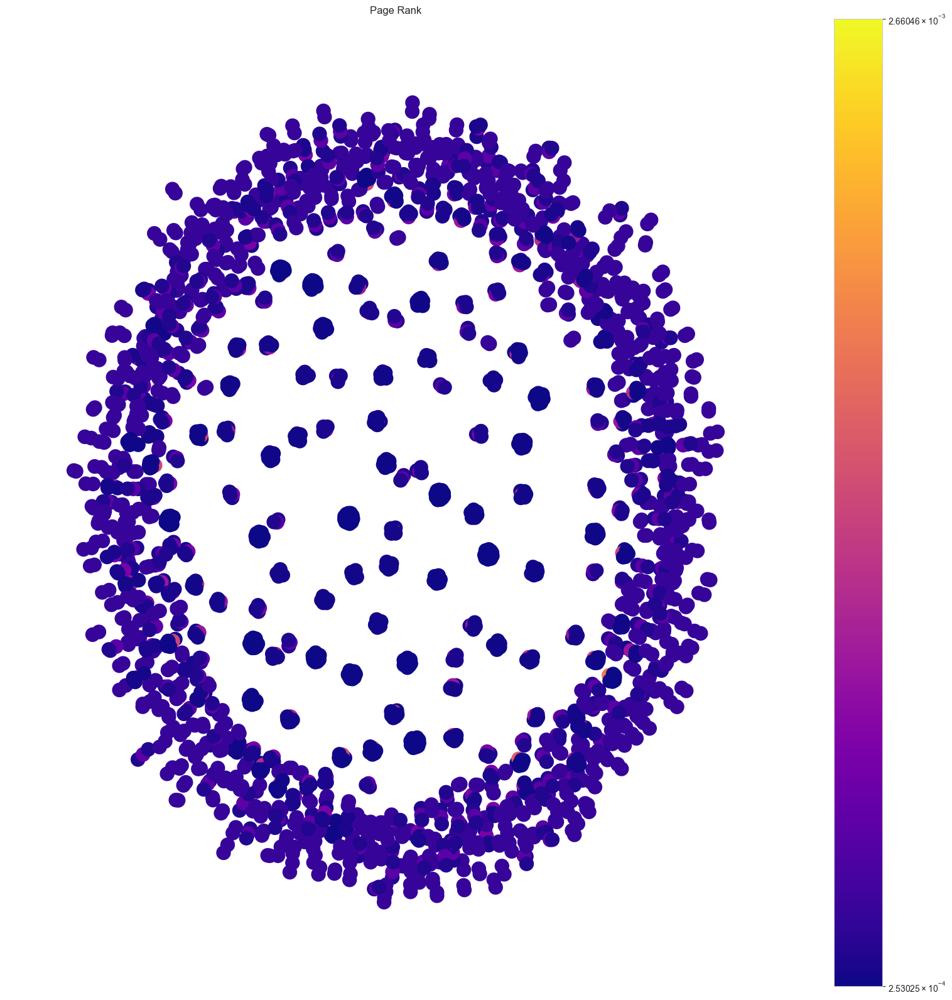

In [33]:
plt.figure(figsize=(20,20))
draw(G, pos, nx.pagerank(fs_graph), 'Page Rank')

In [34]:
dgr = nx.degree_centrality(fs_graph)
clo = nx.closeness_centrality(fs_graph)
har = nx.harmonic_centrality(fs_graph)
bet = nx.betweenness_centrality(fs_graph)
pgr = nx.pagerank(fs_graph)
hits = nx.hits(fs_graph)

In [35]:
centralities = pd.concat(
[pd.Series(c) for c in (hits[1], pgr, har, clo, hits[0], dgr, bet)],
axis=1)
centralities.columns = ("Authorities", "PageRank",
"Harmonic Closeness", "Closeness", "Hubs",
"Degree", "Betweenness")
centralities["Harmonic Closeness"] /= centralities.shape[0]

In [36]:
centralities["Harmonic Closeness"]

1044961877984309248    0.000657
194                    0.000876
1044961839908614145    0.000438
2348                   0.000438
1044961826507710464    0.001972
                         ...   
1128                   0.000438
1044701561274986506    0.001972
1044701479854993408    0.001534
1044701461668614144    0.001534
1044701395633541121    0.000657
Name: Harmonic Closeness, Length: 2282, dtype: float64

In [37]:
# Calculate the correlations for each pair of centralities
import numpy as np
c_df = centralities.corr()
ll_triangle = np.tri(c_df.shape[0], k=-1)
c_df *= ll_triangle
c_series = c_df.stack().sort_values()
c_series.tail()

Degree       Closeness             0.607011
Betweenness  PageRank              0.856167
             Degree                0.915700
Degree       PageRank              0.957264
Closeness    Harmonic Closeness    0.997990
dtype: float64

In [38]:
deg= dict(fs_graph.degree())
nx.set_node_attributes(fs_graph,deg,'degree')

cc = nx.closeness_centrality(fs_graph)
nx.set_node_attributes(fs_graph,cc,'CC')

t= pd.DataFrame.from_dict(dict(fs_graph.nodes(data=True)),orient='index')
t[0:5]

,degree,BC,DC,HC,CC
1044961877984309248,1,0.000000e+00,0.000438,1.5,0.000585
194,2,3.845651e-07,0.000877,2.0,0.000877
1044961839908614145,1,0.000000e+00,0.000438,1.0,0.000438
2348,1,0.000000e+00,0.000438,1.0,0.000438
1044961826507710464,1,0.000000e+00,0.000438,4.5,0.001871


In [39]:
deg= dict(fs_graph.degree())
nx.set_node_attributes(fs_graph,deg,'degree')

pgr = nx.pagerank(fs_graph)
nx.set_node_attributes(fs_graph,pgr,'PR')

t= pd.DataFrame.from_dict(dict(fs_graph.nodes(data=True)),orient='index')
t[0:5]

,degree,BC,DC,HC,CC,PR
1044961877984309248,1,0.000000e+00,0.000438,1.5,0.000585,0.000337
194,2,3.845651e-07,0.000877,2.0,0.000877,0.000640
1044961839908614145,1,0.000000e+00,0.000438,1.0,0.000438,0.000438
2348,1,0.000000e+00,0.000438,1.0,0.000438,0.000438
1044961826507710464,1,0.000000e+00,0.000438,4.5,0.001871,0.000261


In [40]:
t.sort_values('PR',ascending=False)[0:4]

,degree,BC,DC,HC,CC,PR
0,12,0.000025,0.005261,12.0,0.005261,0.002660
13,12,0.000025,0.005261,12.0,0.005261,0.002660
132,11,0.000021,0.004822,11.0,0.004822,0.002458
14,11,0.000021,0.004822,11.0,0.004822,0.002458
